# **Overview of the Project**

This project involves creating a segmentation model to identify water regions in images of flood-hit areas. The dataset consists of 290 labeled images, where each image has an associated mask highlighting the water regions. These annotations were created using Label Studio.

The model we develop can assist in flood impact analysis, enabling better planning and decision-making during emergencies.

---

### Dataset Details

- **Images:** Pictures of flood-hit areas.
- **Masks:** Corresponding annotations showing water-covered regions.
- **metadata.csv:** A file linking each image with its respective mask.

Link to the dataset : https://www.kaggle.com/datasets/faizalkarim/flood-area-segmentation/code

---

### Plan of Action

1. **Load the Data:** Start by importing the flood images and their masks into the workspace.
2. **Understand the Dataset:** Visualize the images and their masks to explore the problem space.
3. **Build the Model:** Use the DeepLabV3+ model, a robust image segmentation architecture, to identify water regions.
4. **Train and Evaluate:** Optimize the model and evaluate its performance.
5. **Test the Model:** Visualize the predictions made by the trained model to verify its accuracy.
6. **Model Insights:** Use GradCAM via the `tf_explain` library to understand how the model interprets the images during segmentation.

---

### Additional Notes

- The use of **GradCAM** will provide interpretability by highlighting areas in the images that the model deems most relevant for segmentation.
- This process ensures that the model is not only accurate but also explainable, aiding its real-world applicability.

# **Imports**

In [1]:
from IPython.display import clear_output as cls

!pip install tf_explain

cls()

In [2]:
# General Libraries
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras

# Data Handling and Preprocessing
from tqdm import tqdm
from glob import glob
import tensorflow.image as tfi
from tensorflow.keras.utils import load_img, img_to_array

# Data Visualization
import matplotlib.pyplot as plt

# Model Layers and Architecture
from keras.models import Model
from keras.layers import Layer, Input, Conv2D, Concatenate, UpSampling2D, AveragePooling2D
from keras.layers import BatchNormalization, LeakyReLU, ReLU
from keras.models import Sequential

# Pre-trained Backbone (ResNet50)
from tensorflow.keras.applications import ResNet50

# Visualizing Model Architecture
from tensorflow.keras.utils import plot_model

# Optimizer
from tensorflow.keras.optimizers import Adam

# Callbacks for Model Training
from keras.callbacks import ModelCheckpoint, Callback

# GradCAM for Model Interpretation
from tf_explain.core.grad_cam import GradCAM

# **Dataset Loading**

In [3]:
# Specify paths
root_path = '/kaggle/input/flood-area-segmentation/'
image_path = '/kaggle/input/flood-area-segmentation/Image/'
mask_path = '/kaggle/input/flood-area-segmentation/Mask/'
metadata_path = "/kaggle/input/flood-area-segmentation/metadata.csv"

## Loading and Displaying Metadata

In [4]:
metadata = pd.read_csv(metadata_path)

metadata

,Image,Mask
0,0.jpg,0.png
1,1.jpg,1.png
2,2.jpg,2.png
3,3.jpg,3.png
4,4.jpg,4.png
...,...,...
285,1083.jpg,1083.png
286,1084.jpg,1084.png
287,1085.jpg,1085.png
288,1086.jpg,1086.png


This file contains the filenames of the images and their corresponding mask files. While we could use the `metadata.csv` file to load the images and masks, I have a better approach. Let’s create a function that will handle the entire data loading process. This will streamline the workflow and make it more efficient.

In [5]:
def load_image(path: str, size: tuple = (256, 256), is_mask: bool = False):
    """
    This function loads and processes an image or mask. It reads the file from the given path, 
    resizes it to the specified size, converts it to a 32-bit floating-point tensor, and 
    scales the pixel values to a range between 0 and 1. If the input is a mask, it ensures the 
    result has only one channel.

    Parameters:
        path (str): The file path to the image or mask.
        size (tuple): The desired dimensions for resizing the image. Default is (256, 256).
        is_mask (bool): Specifies if the input is a mask. If True, the output 
                        will have a single channel. Default is False.
    
    """
    # Load the image from the given path
    image = load_img(path)
    
    # Convert the image to a NumPy array
    image = img_to_array(image)
    
    # Resize the image to the specified dimensions
    image = tfi.resize(image, size)
    
    # Convert the image to a 32-bit float tensor
    image = tf.cast(image, tf.float32)
    
    # Normalize pixel values to the range [0, 1]
    image = image / 255.0
    
    # If the input is a mask, ensure it has a single channel
    if is_mask:
        image = image[:, :, :1]
        
    # Return the preprocessed image or mask
    return image


In [6]:
def load_data(root_path: str = root_path):
    """
    This function loads all images and their corresponding masks from the specified directory.
    It finds the file paths for the images, converts them to mask file paths, and then loads 
    the data into arrays. The function returns two arrays: one for the images and another for the masks.

    """
    # Get paths for all images and masks
    image_paths = sorted(glob(root_path + "Image/*.jpg"))
    mask_paths = [path.replace("Image", "Mask").replace("jpg", "png") for path in image_paths]

    # Prepare empty arrays to hold the images and masks
    images = np.empty(shape=(len(image_paths), 256, 256, 3), dtype=np.float32)
    masks = np.empty(shape=(len(image_paths), 256, 256, 1), dtype=np.float32)

    # Load images and masks into the arrays
    for i, (img_path, mask_path) in tqdm(enumerate(zip(image_paths, mask_paths)), desc="Loading"):
        # Load each image
        image = load_image(path=img_path, is_mask=False)

        # Load the corresponding mask
        mask = load_image(path=mask_path, is_mask=True)

        # Store them in the arrays
        images[i] = image
        masks[i] = mask

    # Return the arrays containing images and masks
    return images, masks


In [7]:
all_images, all_masks = load_data(root_path)

Loading: 290it [00:30,  9.63it/s]


# **Split the dataset**

In [8]:
# Split data into Training and Testing
data_len = len(all_images)

# Training set
train_images, train_masks = all_images[:int(data_len*0.8)], all_masks[:int(data_len*0.8)]

# Testing Set
test_images,  test_masks = all_images[int(data_len*0.8):], all_masks[int(data_len*0.8):]

# **Data Visualization**

Here we have created a function to display an image alongside its corresponding mask.

In [10]:
def show_images(images, masks, n_images, SIZE=(15,8)) -> None:

for _ in range(n_images):
        # Create a new figure for each image
        plt.figure(figsize=SIZE)

        # Randomly select an image
        idx = np.random.randint(len(images))

        # Display the original image
        plt.subplot(1, 3, 1)
        plt.imshow(images[idx])
        plt.title("Original Image")
        plt.axis("off")

        # Display the mask
        plt.subplot(1, 3, 2)
        plt.imshow(masks[idx], cmap="gray")
        plt.title("Mask")
        plt.axis("off")

        # Display the image with the overlayed mask
        plt.subplot(1, 3, 3)
        plt.imshow(images[idx])
        plt.imshow(masks[idx], cmap="gray", alpha=0.5)
        plt.title("Overlayed Mask")
        plt.axis("off")

        # Adjust layout and show the plot
        plt.tight_layout()
        plt.show()

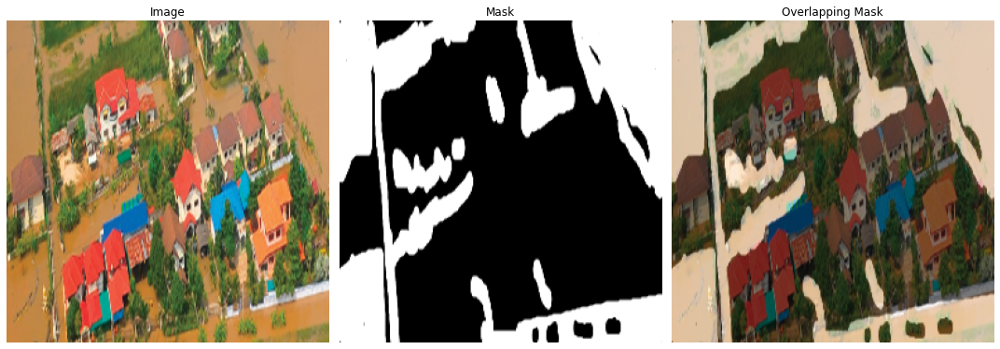

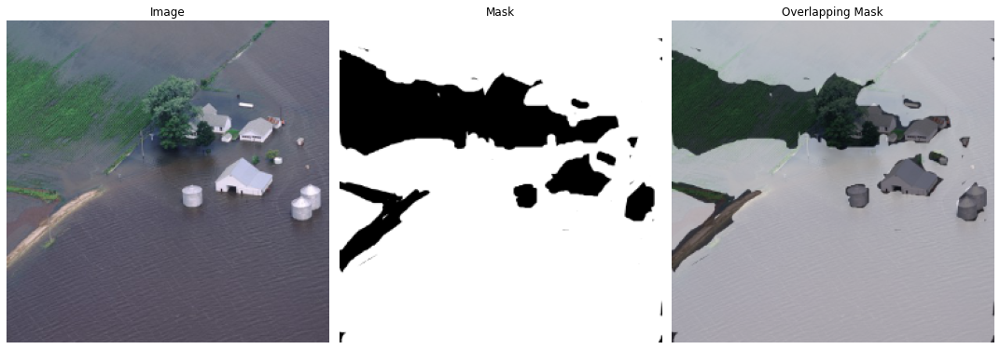

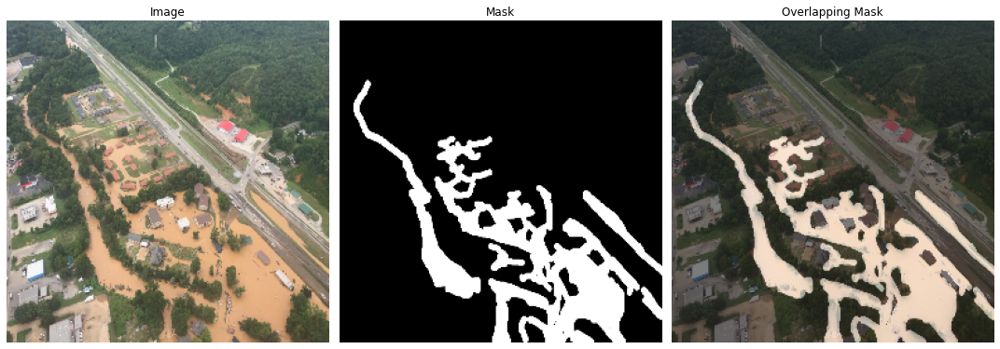

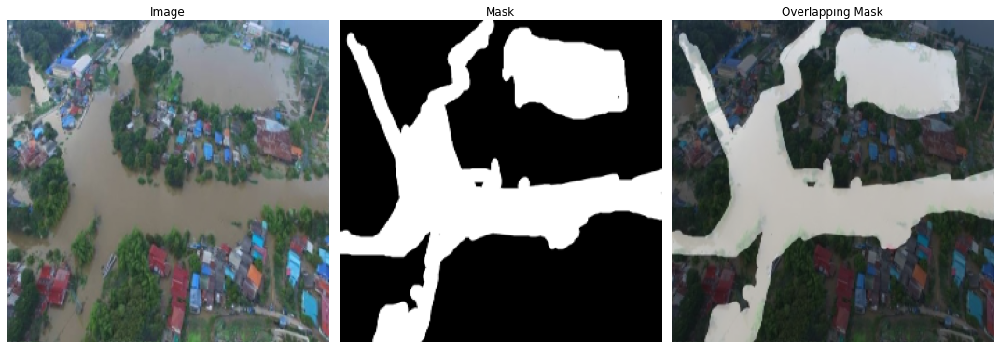

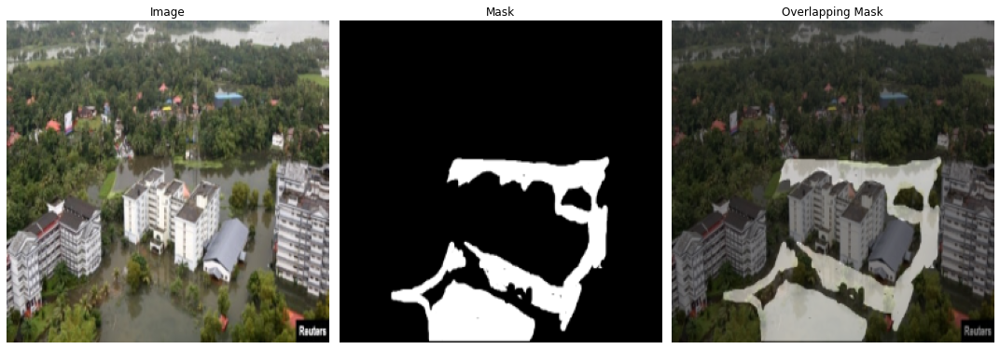

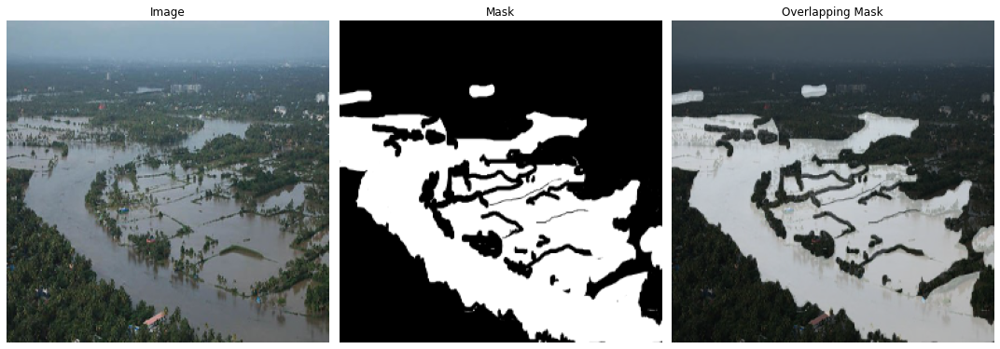

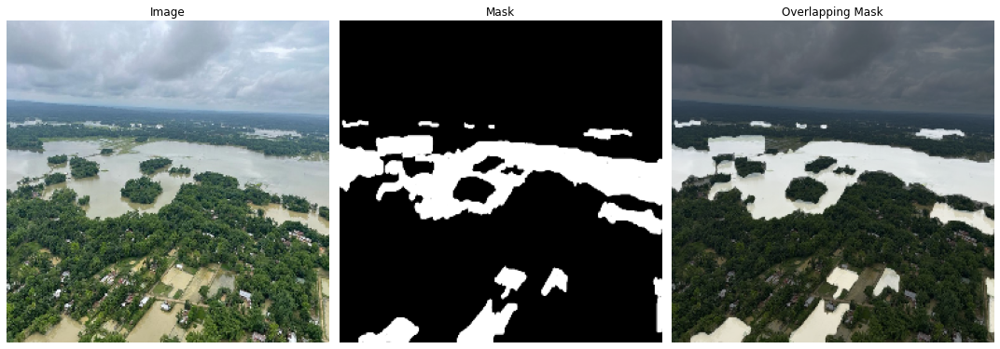

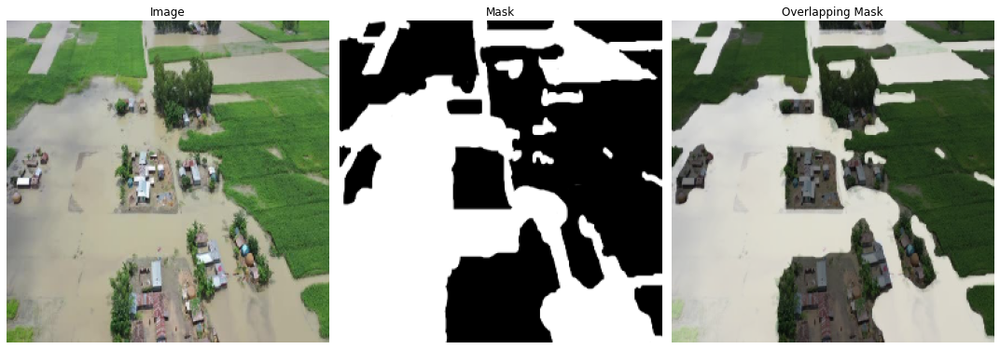

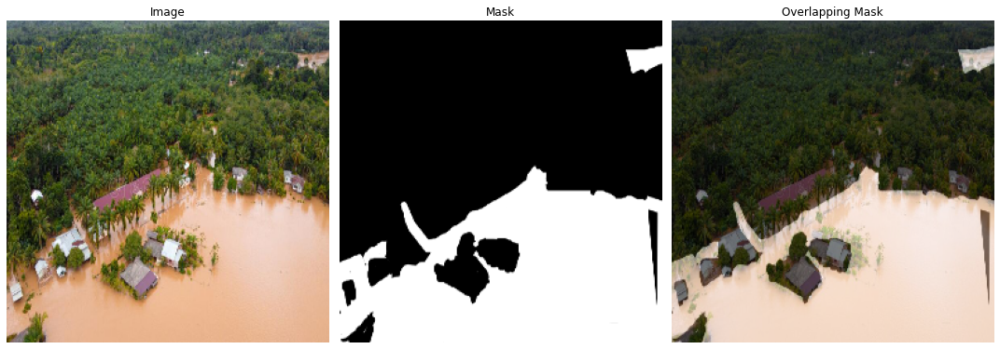

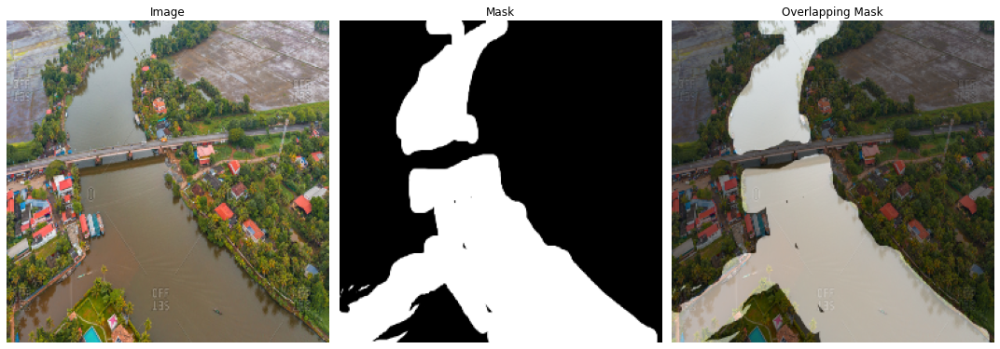

In [11]:
# Display 10 random images and their corresponding masks
show_images(train_images, train_masks, n_images=10)

# **DeepLabV3+**

DeepLabV3+ is an enhanced version of DeepLabV3 with an encoder-decoder structure. It uses Atrous Spatial Pyramid Pooling to capture features at different scales from ResNet50. High-level features help the model understand the object in the image, while low-level features provide spatial and geometric details. These features are combined to generate the final mask for segmentation.

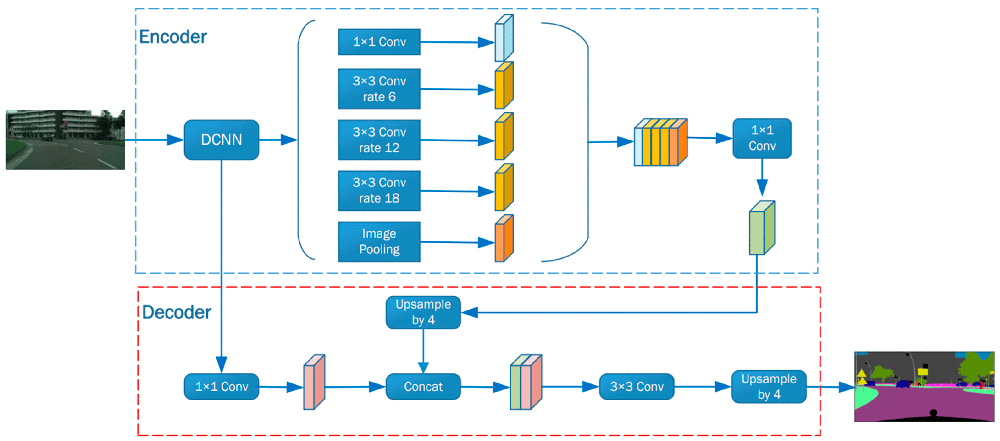


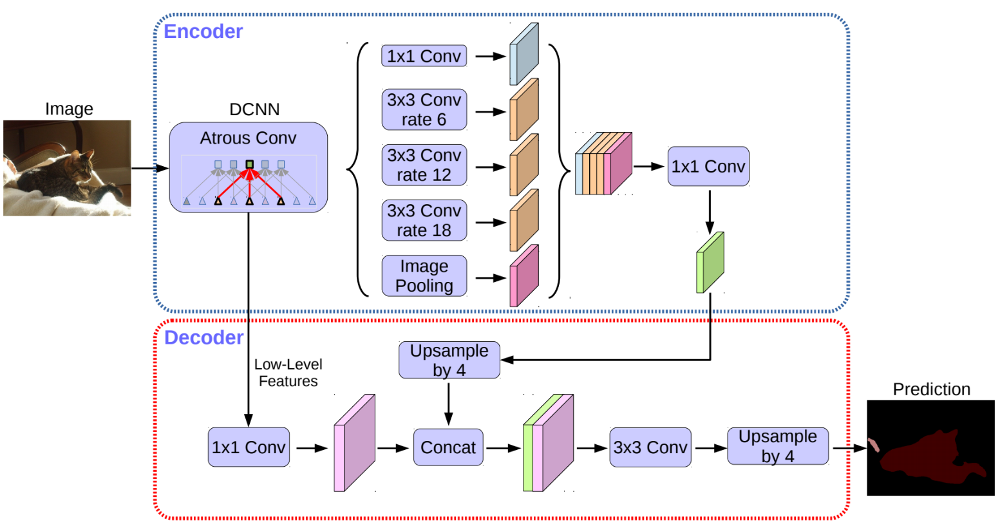
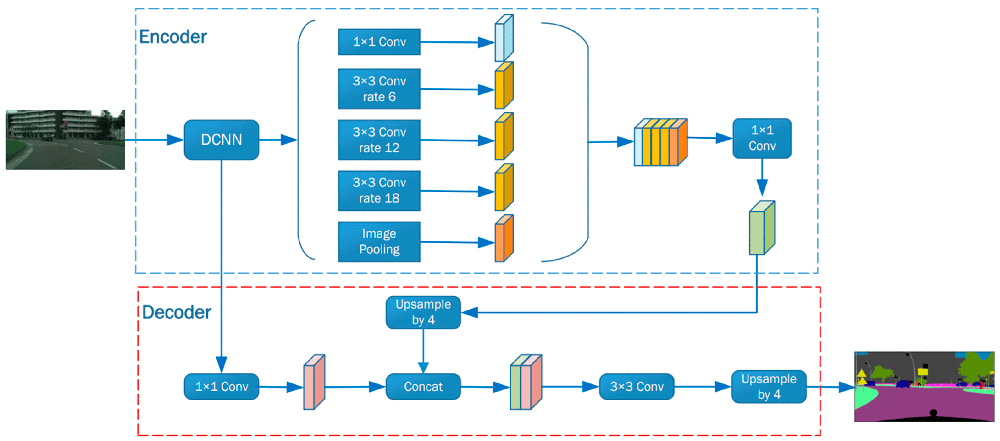

In [11]:
class ConvBlock(Layer):
    
    def __init__(self, filters:int = 256, kernel_size:int = 3, dilation_rate:int = 1, **kwargs) -> None:
        super(ConvBlock, self).__init__(**kwargs)
        
        # Define Parameters
        self.filters = filters
        self.kernel_size = kernel_size
        self.dilation_rate = dilation_rate
        
        # Define the model 
        self.net = Sequential([
            Conv2D(filters, kernel_size=kernel_size, padding='same', strides=1, dilation_rate=dilation_rate, activation=None, use_bias=False),
            BatchNormalization(),
            ReLU()
        ])
    
    def call(self, X):
        # Apply the layers
        return self.net(X)
    
    def get_config(self):
        base_config = super().get_config()
        
        return {
            **base_config,
            "filters":self.filters,
            "kernel_size":self.kernel_size,
            "dilation_rate":self.dilation_rate
        }

## Define Astrous Spatial Pyramid Pooling Layer

In [12]:
def AtrousSpatialPyramidPooling(X):
    
    # Shape
    _, H, W, C = X.shape
    
    # Image Pooling 
    image_pool = AveragePooling2D(pool_size=(H, W), name="ASPP-ImagePool-AP")(X)
    image_pool = ConvBlock(kernel_size=1, name="ASPP-ImagePool-CB")(image_pool)
    image_pool = UpSampling2D(size=(H//image_pool.shape[1], W//image_pool.shape[1]), name="ASPP-ImagePool-US")(image_pool)
    
    # Astrous Layers
    conv_1  = ConvBlock(kernel_size=1, dilation_rate=1, name="ASPP-Conv1")(X)
    conv_6  = ConvBlock(kernel_size=3, dilation_rate=6, name="ASPP-Conv6")(X)
    conv_12 = ConvBlock(kernel_size=3, dilation_rate=12, name="ASPP-Conv12")(X)
    conv_18 = ConvBlock(kernel_size=3, dilation_rate=18, name="ASPP-Conv18")(X)
    
    # Combine All
    combined = Concatenate(name="ASPP-Concatenate")([image_pool, conv_1, conv_6, conv_12, conv_18])
    output = ConvBlock(kernel_size=1, name="ASPP-Out")(combined)
    
    return output

## Make the DeepLabV3+ Encoder-Decoder model

In [13]:
# Model Configuration
IMAGE_SIZE = 256  # Size of input image
MODEL_NAME = "DeepLab-FloodArea"  # Name of the model

# Input Layer
inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="InputLayer")

# Backbone Network (ResNet50)
backbone = ResNet50(input_tensor=inputs, weights='imagenet', include_top=False)

# High-Level Feature Extraction
DCNN = backbone.get_layer('conv4_block6_2_relu').output  # Extract high-level features from ResNet50
ASPP = AtrousSpatialPyramidPooling(DCNN)  # Apply Atrous Spatial Pyramid Pooling
ASPP = UpSampling2D(size=(
    IMAGE_SIZE//4//ASPP.shape[1], IMAGE_SIZE//4//ASPP.shape[2]
), name="ASPP-UpSample-Out")(ASPP)  # Upsample to match the image size

# Low-Level Feature Extraction
LLF = backbone.get_layer('conv2_block3_2_relu').output  # Extract low-level features from ResNet50
LLF = ConvBlock(filters=48, kernel_size=1, name="LLF-ConvBlock")(LLF)  # Apply a ConvBlock for low-level features

# Combine High-Level and Low-Level Features
concat = Concatenate(axis=-1, name="Concat-LLF-HLF")([LLF, ASPP])  # Concatenate both feature sets
y = ConvBlock(name="TopConvBlock1")(concat)  # Apply a convolution block
y = ConvBlock(name="TopConvBlock2")(y)  # Apply another convolution block
y = UpSampling2D(size=(
    IMAGE_SIZE//y.shape[1], IMAGE_SIZE//y.shape[2]
), name="Feature-UpSample")(y)  # Upsample the final features to match image size

# Output Layer
output = Conv2D(filters=1, kernel_size=3, padding='same', activation='sigmoid', use_bias=False, name="OutputLayer")(y)  # Final output with sigmoid activation

# Build Model
DeepLabV3 = Model(inputs, output, name=MODEL_NAME)  # Create the model with the input and output


94781440/94765736 [==============================] - 1s 0us/step


## Visualize model architecture

In [14]:
DeepLabV3.summary()

Model: "DeepLab-FloodArea"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
InputLayer (InputLayer)         [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           InputLayer[0][0]                 
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
__________________________________________________________________________________

# **Model Callback**

This callback will plot the model’s predictions on the validation data after every 10 epochs to visually track how the model is improving over time.

In [15]:
def show_model_preds(images, masks, model, SIZE:tuple = (15,8)) -> None:
    # Randomly select an image and its mask
    id = np.random.randint(len(test_images))
    image, mask = images[id], masks[id]
    
    # Get model prediction for the mask
    pred_mask = model.predict(tf.expand_dims(image, axis=0))
            
    # Generate Grad CAM heatmap
    cam = GradCAM()
    capture = cam.explain(
        validation_data=(tf.expand_dims(image, axis=0).numpy(), mask),
        model=model,
        class_index=1,
        layer_name="TopConvBlock2"
    )
            
    # Set plot size
    plt.figure(figsize=SIZE)
    
    # Plot input image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Input Image")
    plt.axis('off')
    
    # Plot expected mask
    plt.subplot(1,4,2)
    plt.title("Expected Mask")
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
            
    # Plot predicted mask
    plt.subplot(1,4,3)
    plt.imshow(tf.squeeze(pred_mask), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis('off')
            
    # Plot Grad CAM heatmap
    plt.subplot(1,4,4)
    plt.title("Grad CAM Visualization")
    plt.imshow(tf.squeeze(capture))
    plt.axis('off')
            
    # Display the plot
    plt.show()


Display predictions at the end of every 10th epoch

In [16]:
class ShowProgress(Callback):
    
    def on_epoch_end(self, epoch, logs=None):
        if (epoch+1)%10==0:
            show_model_preds(test_images, test_masks, self.model)

Epoch 1/20
29/29 [==============================] - 257s 9s/step - loss: 0.1379 - val_loss: 0.5899
Epoch 2/20
29/29 [==============================] - 248s 9s/step - loss: 0.1399 - val_loss: 0.4653
Epoch 3/20
29/29 [==============================] - 246s 9s/step - loss: 0.1260 - val_loss: 0.3781
Epoch 4/20
29/29 [==============================] - 249s 9s/step - loss: 0.1333 - val_loss: 0.6114
Epoch 5/20
29/29 [==============================] - 248s 9s/step - loss: 0.1296 - val_loss: 0.3054
Epoch 6/20
29/29 [==============================] - 250s 9s/step - loss: 0.1143 - val_loss: 0.2883
Epoch 7/20
29/29 [==============================] - 246s 9s/step - loss: 0.1084 - val_loss: 0.2902
Epoch 8/20
29/29 [==============================] - 247s 9s/step - loss: 0.1128 - val_loss: 0.2996
Epoch 9/20
29/29 [==============================] - 246s 9s/step - loss: 0.1128 - val_loss: 0.3002
Epoch 10/20
29/29 [==============================] - 247s 9s/step - loss: 0.1042 - val_loss: 0.2413


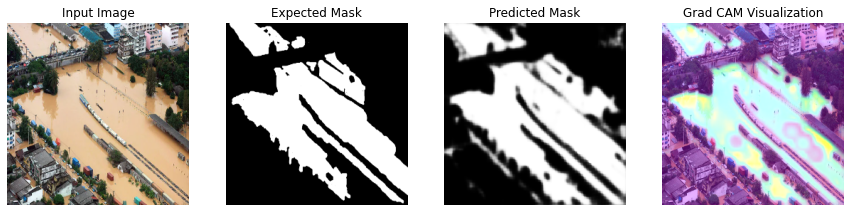

Epoch 11/20
29/29 [==============================] - 245s 8s/step - loss: 0.0986 - val_loss: 0.2494
Epoch 12/20
29/29 [==============================] - 243s 8s/step - loss: 0.0952 - val_loss: 0.2542
Epoch 13/20
29/29 [==============================] - 242s 8s/step - loss: 0.0926 - val_loss: 0.2490
Epoch 14/20
29/29 [==============================] - 246s 9s/step - loss: 0.0885 - val_loss: 0.2686
Epoch 15/20
29/29 [==============================] - 244s 8s/step - loss: 0.0845 - val_loss: 0.2644
Epoch 16/20
29/29 [==============================] - 247s 9s/step - loss: 0.0830 - val_loss: 0.2515
Epoch 17/20
29/29 [==============================] - 248s 9s/step - loss: 0.0824 - val_loss: 0.2514
Epoch 18/20
29/29 [==============================] - 247s 9s/step - loss: 0.0848 - val_loss: 0.2566
Epoch 19/20
29/29 [==============================] - 251s 9s/step - loss: 0.0819 - val_loss: 0.2486
Epoch 20/20
29/29 [==============================] - 247s 9s/step - loss: 0.0796 - val_loss: 0.2565


In [ ]:
# Compile the model with loss and optimizer
DeepLabV3.compile(
    loss='binary_crossentropy',
    optimizer="adam"
)

# Define callbacks for model checkpoint and progress visualization
callbacks = [
    ModelCheckpoint(MODEL_NAME + ".h5", save_best_only=True),
    ShowProgress()
]

# Train the model with training and validation data
history = DeepLabV3.fit(
    train_images, train_masks,
    validation_data=(test_images, test_masks),
    epochs=100,
    callbacks=callbacks,
    batch_size=8,
)


During training, the model gets better at predicting the masks. The Grad CAM shows it focuses on the water. The predicted masks may look blurry, but that's normal since sharp boundaries aren't needed. The loss goes down steadily, showing the model is learning. At the 72nd epoch, the training has a small issue, but after that, the model performs even better.

# **Learning Curve**

The **learning curve** shows how the model's performance improves over time. It tracks the **loss** and **accuracy** during training. As the model learns, the loss decreases and the accuracy increases. This helps to understand if the model is learning properly or if it's overfitting or underfitting.

In [ ]:
pd.DataFrame(history.history).plot(figsize=(15,5))
plt.ylim([0.0,1.0])
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.show()

# **Model Predictions**

In [ ]:
for i in range(20):
    show_model_preds(test_images, test_masks, model=DeepLabV3, SIZE=(25,8))

# **References**

[1]R. Ghimire, “Semantic Segmentation Using DeepLabV3+ from scratch,” Medium, Feb. 10, 2023. https://medium.com/@r1j1nghimire/semantic-segmentation-using-deeplabv3-from-scratch-b1ff57a27be

[2]N. Vishwakarma, “Visualizing Model Insights: A Guide to Grad-CAM in Deep Learning,” Analytics Vidhya, Dec. 15, 2023. https://www.analyticsvidhya.com/blog/2023/12/grad-cam-in-deep-learning/
‌
‌